## Installation de la bibliothèque `ultralytics`

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 799.4/799.4 kB 12.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## Import de bibliothèques

In [3]:
import os, glob
from pathlib import Path
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from xml.etree import ElementTree as ET
from skimage import io
import shutil

## Telechargement des données sur Kaggle

Les données sont issues de Kaggle à travers ce [lien](https://www.kaggle.com/datasets/riotulab/aerial-images-of-palm-trees)

In [4]:
!kaggle datasets download -d riotulab/aerial-images-of-palm-trees

Dataset URL: https://www.kaggle.com/datasets/riotulab/aerial-images-of-palm-trees
License(s): unknown
100% 778M/780M [00:45<00:00, 19.8MB/s]
100% 780M/780M [00:45<00:00, 18.1MB/s]


In [5]:
import zipfile
zip_ref = zipfile.ZipFile('/content/aerial-images-of-palm-trees.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

## Inspection et organisation des données

In [6]:
# Création des dossiers
base_data_folder = "/content/trees_data"
Path(base_data_folder).mkdir(parents=True, exist_ok=True)

Path(base_data_folder + "/train").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/train/images").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/train/labels").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/valid").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/valid/images").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/valid/labels").mkdir(parents=True, exist_ok=True)

In [7]:
import pandas as pd
a = pd.read_csv("/content/Palm-Counting-349images/test_labels.csv")

In [8]:
a["class"].unique()

array(['Tree', 'Palm'], dtype=object)

In [9]:

def get_img_bboxes_from_df(dataframe, img_name, labels_mapping):
  """
    Récupérer la liste des boites et leur classes
    à partir du dataframe de pandas

    dataframe : dataframe de pandas
    img_name : nom de l'image
    labels_mapping : dictionnaire des classes : {'Palm': 0, 'Tree': 1}

    return:
    bboxes : liste des boites et leur classes -> [(class_id, x_center, y_center, width, height)]
  """
  df_img = dataframe[dataframe["filename"] == img_name]
  width = df_img.xmax - df_img.xmin
  height = df_img.ymax - df_img.ymin
  x_center = (df_img.xmin + df_img.xmax)/2
  y_center = (df_img.ymin + df_img.ymax) / 2
  classes = df_img["class"].map(lambda x: labels_mapping[x])

  x_center_norm = x_center / df_img.width
  y_center_norm = y_center / df_img.height
  width_norm = width / df_img.width
  height_norm = height / df_img.height

  bboxes = list(zip(classes, x_center_norm, y_center_norm, width_norm, height_norm))
  print(bboxes)

  return bboxes

In [10]:
def create_and_save_annotations(csv_annotations, labels_endoding, save_path):
  """
    Créer les annotations de YOLOv8
  """
  df = pd.read_csv(csv_annotations)
  image_names = df.filename.unique().tolist()
  # Pour chaque image :
  for image_name in image_names:
    # Récupérer les labels [(class, xc, yc, width, height), ...]
    labels = get_img_bboxes_from_df(dataframe=df, img_name=image_name, labels_mapping=labels_endoding)

    # Sauvegarder les annotations dans un fichier .txt
    f_path = os.path.join(save_path, image_name.split(".")[0] + ".txt")
    with open(f_path, "w+") as f:
      # for bbox in labels:
      #  f.write(f"{bbox[0]} {bbox[1]} {bbox[2]} {bbox[3]} {bbox[4]}\n")
      labels = [f"{label[0]} {label[1]} {label[2]} {label[3]} {label[4]}\n" for label in labels]
      f.writelines(labels)

  return image_names


def copy_images(src_folder, images_names, save_path):
  """

  """
  for image in images_names:
    shutil.copy(os.path.join(src_folder, image), save_path)


def create_data(csv_annotations, labels_mapping, images_folder, save_folder):
  """
    Créer les annotations de YOLOv8 et copie les images
  """
  nom_images = create_and_save_annotations(csv_annotations, labels_mapping, save_path=save_folder + "/labels")
  copy_images(src_folder=images_folder, images_names=nom_images, save_path=save_folder + "/images")

In [11]:
# Classes : Palm and Tree
labels_endoding = {
    "Palm": 0,
    "Tree": 1
}
csv_annotations = ["/content/Palm-Counting-349images/test_labels.csv", "/content/Palm-Counting-349images/train_labels.csv"]
images_folders = ["""/content/Palm-Counting-349images/test""", "/content/Palm-Counting-349images/train"]
save_base_folders = ["/content/trees_data/valid", "/content/trees_data/train"]

for annotation_file, images_folder, save_folder in zip(csv_annotations, images_folders, save_base_folders):
  create_data(annotation_file, labels_endoding, images_folder, save_folder)

[(1, 0.4447985197368421, 0.3423793859649123, 0.07627467105263158, 0.09046052631578948), (1, 0.5162417763157895, 0.6047149122807017, 0.08881578947368421, 0.14199561403508773), (1, 0.33614309210526316, 0.5649671052631579, 0.11389802631578948, 0.16228070175438597), (1, 0.0390625, 0.7483552631578947, 0.078125, 0.13760964912280702), (1, 0.4041940789473684, 0.8229166666666666, 0.12417763157894737, 0.14364035087719298), (1, 0.5740131578947368, 0.8574561403508771, 0.09375, 0.13815789473684212), (1, 0.6973684210526315, 0.6611842105263158, 0.125, 0.17324561403508773), (1, 0.8795230263157895, 0.6825657894736842, 0.08963815789473684, 0.11951754385964912), (1, 0.9337993421052632, 0.9133771929824561, 0.08799342105263158, 0.14473684210526316), (1, 0.8009868421052632, 0.39473684210526316, 0.09375, 0.14035087719298245), (1, 0.3782894736842105, 0.08223684210526316, 0.09046052631578948, 0.11842105263157894), (1, 0.03495065789473684, 0.03618421052631579, 0.06990131578947369, 0.06798245614035088), (1, 0.91

## Visualisation d'images et annotations

In [12]:
# Télécharger le style de texte arial
!wget https://font.download/dl/font/arial.zip

import zipfile
zip_ref = zipfile.ZipFile('/content/arial.zip', 'r')
Path('/content/arial').mkdir(parents=True, exist_ok=True)
zip_ref.extractall('/content/arial')
zip_ref.close()

--2024-07-07 20:24:58--  https://font.download/dl/font/arial.zip
Resolving font.download (font.download)... 172.67.140.4, 104.21.46.145, 2606:4700:3033::ac43:8c04, ...
Connecting to font.download (font.download)|172.67.140.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3834335 (3.7M) [application/zip]
Saving to: ‘arial.zip’

arial.zip           100%[===================>]   3.66M  --.-KB/s    in 0.02s   

2024-07-07 20:24:58 (212 MB/s) - ‘arial.zip’ saved [3834335/3834335]



In [13]:
def get_img_annotations(img_path):
  label_path = img_path.replace(".jpg", ".txt").replace("images", "labels")
  assert Path(label_path).exists(), f"Label path {label_path} does not exist"
  height_img, width_img, _ = io.imread(img_path).shape
  tree_annotations = []
  with open(label_path) as f:
    for line in f.readlines():
      class_id, x_center, y_center, width, height = line.split(" ")
      x_center = float(x_center) * width_img
      y_center = float(y_center) * height_img
      width = float(width) * width_img
      height = float(height) * height_img

      x1 = x_center - width/2
      y1 = y_center - height/2
      x2 = x_center + width/2
      y2 = y_center + height/2
      tree_annotations.append((class_id, int(x1), int(y1), int(x2), int(y2)))
  return tree_annotations

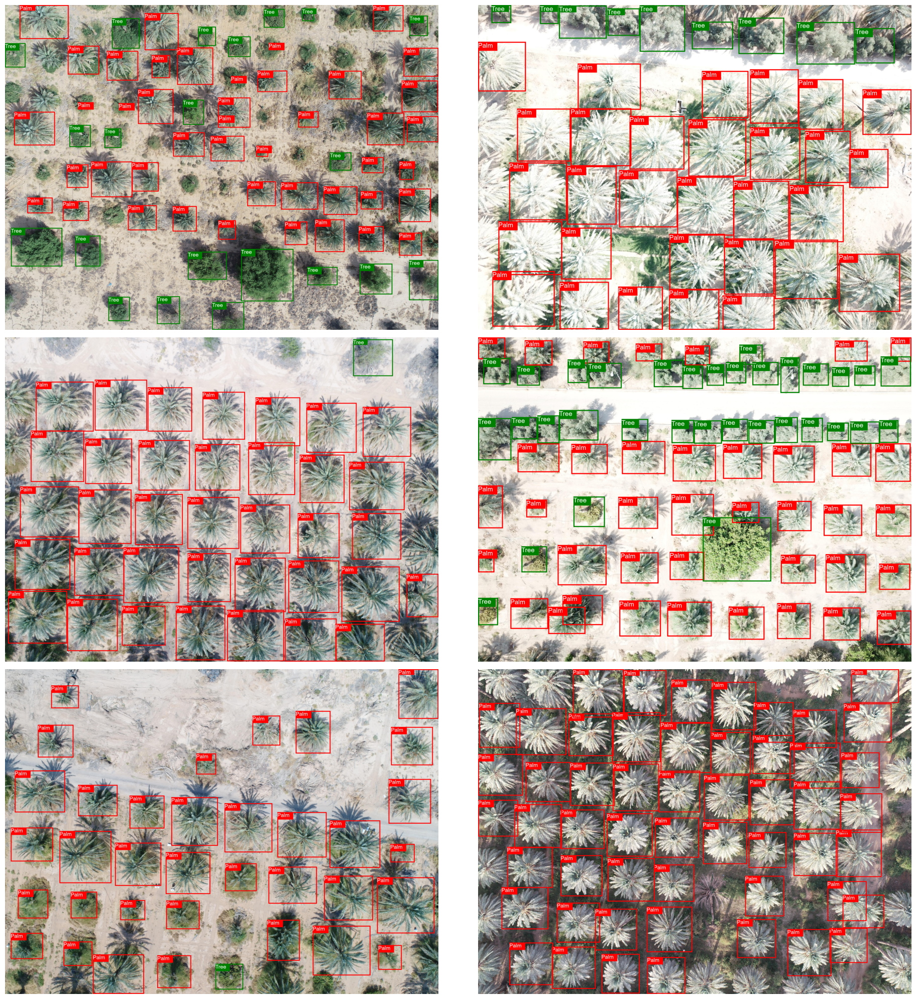

In [14]:
n_images = 6
images = glob.glob("/content/trees_data/train/images/*.jpg")[:n_images]
fig, axs = plt.subplots(3, 2, figsize=(20, 20))
for img_path, ax in zip(images, axs.flatten()):
  img_pil = Image.open(img_path)
  annotations = get_img_annotations(img_path=img_path)
  for annotation in annotations:
    texte = "Palm" if int(annotation[0]) == 0 else "Tree"
    color = "red" if int(annotation[0]) == 0 else "green"

    font = ImageFont.truetype("/content/arial/ARIAL.TTF", 60)
    x1, y1, x2, y2 = font.getbbox(texte, anchor="ms")
    h = y2 - y1
    w = x2 - x1

    x_1, y_1, x_2, y_2 = annotation[1:]

    y1 = y_1
    x1 = x_1
    x2 = x_1 + w + 20
    y2 = y_1 + h + 20

    if y_1 - h < 0:
      y2 = y_1 + h



    text_anchor = [x1, y1, x2+20, y2+20]
    bbox = [x_1, y_1, x_2, y_2]


    ImageDraw.Draw(img_pil).rectangle(bbox, outline=color, width=10)
    ImageDraw.Draw(img_pil).rectangle(text_anchor, outline=color, fill=color, width=10)
    ImageDraw.Draw(img_pil).text(text_anchor, texte, fill="white", font=font)

  ax.imshow(np.asarray(img_pil))
  ax.axis("off")

fig.tight_layout()

## Configuration et entrainement du modèle YOLOv8

Créer le fichier `data.yaml` dans le repertoire `/content/trees_data` et y ajouter le contenu

```
names:
- Palm
- Tree
nc: 2
train: /content/trees_data/train/images
val: /content/trees_data/valid/images
```

Palm : 0 et Tree : 1


In [15]:
content = """
names:
- Palm
- Tree
nc: 2
train: /content/trees_data/train/images
val: /content/trees_data/valid/images"""

with open("/content/trees_data/data.yaml", "w+") as f:
  f.write(content)

In [16]:
from ultralytics import YOLO

In [ ]:
data = "/content/trees_data/data.yaml"
save_path = "/content/drive/MyDrive/DeepLearningForEO-UdemyTraining/PalmTreeDetection"
name = "yolov10sTrain1"
model_ckpt = "yolov10s.pt"
resume = False
epochs = 500


model  = YOLO(model_ckpt)

results = model.train(data=data, epochs=epochs, project=save_path, resume=resume,  name=name, patience=100, optimizer="Adam", batch=8)


100%|██████████| 15.9M/15.9M [00:00<00:00, 335MB/s]


Ultralytics YOLOv8.2.50 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov10s.pt, data=/content/trees_data/data.yaml, epochs=500, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/DeepLearningForEO-UdemyTraining/PalmTreeDetection, name=yolov10sTrain1, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt

100%|██████████| 755k/755k [00:00<00:00, 87.9MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1     36096  ultralytics.nn.modules.block.SCDown          [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1    137728  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 208MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/trees_data/train/labels... 279 images, 0 backgrounds, 0 corrupt: 100%|██████████| 279/279 [00:00<00:00, 1651.06it/s]

train: New cache created: /content/trees_data/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/trees_data/valid/labels... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<00:00, 575.65it/s]

val: New cache created: /content/trees_data/valid/labels.cache


Plotting labels to /content/drive/MyDrive/DeepLearningForEO-UdemyTraining/PalmTreeDetection/yolov10sTrain1/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 99 weight(decay=0.0), 112 weight(decay=0.0005), 111 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/DeepLearningForEO-UdemyTraining/PalmTreeDetection/yolov10sTrain1
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/500      3.84G       3.91      4.269      3.144        359        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.34s/it]

                   all         70       2670          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/500      3.28G       3.54      2.843      2.986        315        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all         70       2670          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/500      3.68G      3.566      2.682      2.964        460        640: 100%|██████████| 35/35 [01:05<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.32s/it]

                   all         70       2670          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/500       4.1G      3.369       2.48      2.974        587        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]

                   all         70       2670          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/500       3.9G      3.475      2.393      3.003        360        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.10s/it]

                   all         70       2670     0.0947     0.0639     0.0331     0.0114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/500      4.16G      3.406      2.212       2.88        618        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all         70       2670      0.386      0.348      0.372       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/500      3.86G      3.313      2.146      2.888        333        640: 100%|██████████| 35/35 [01:08<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.13s/it]

                   all         70       2670       0.28       0.27      0.261      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/500      3.65G      3.233      2.138      2.866        466        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]

                   all         70       2670      0.423      0.398      0.396      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/500      3.66G      3.189      2.039      2.797        426        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.11it/s]

                   all         70       2670      0.915       0.32      0.447      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/500      3.76G      3.179      2.025      2.818        407        640: 100%|██████████| 35/35 [01:05<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all         70       2670      0.418      0.271      0.256      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/500       3.7G       3.05      1.926      2.723        495        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.81s/it]

                   all         70       2670      0.438      0.478      0.471       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/500      3.79G      3.096      1.892       2.69        536        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all         70       2670      0.424      0.607      0.567      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/500      4.07G      3.119      1.939      2.721        408        640: 100%|██████████| 35/35 [01:05<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all         70       2670      0.487      0.459      0.459      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/500      4.57G      3.013      1.825      2.696        388        640: 100%|██████████| 35/35 [01:07<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all         70       2670      0.457      0.525      0.518       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/500      4.24G      3.012      1.792      2.682        476        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.59s/it]

                   all         70       2670      0.481      0.542      0.501      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/500      3.74G      3.018      1.841      2.693        403        640: 100%|██████████| 35/35 [01:01<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all         70       2670      0.469      0.563      0.555      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/500      3.25G      2.945      1.736      2.681        488        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.22it/s]

                   all         70       2670      0.601        0.6      0.614      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/500      3.51G      2.984      1.723      2.697        408        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.41s/it]

                   all         70       2670      0.512      0.495      0.506      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/500      3.41G       2.98      1.684      2.641        521        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.08s/it]

                   all         70       2670      0.538      0.517      0.535      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/500      3.94G      2.982      1.718      2.669        514        640: 100%|██████████| 35/35 [01:05<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.07s/it]

                   all         70       2670      0.584      0.586        0.6      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/500      3.43G      2.914      1.641      2.672        346        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.33s/it]

                   all         70       2670       0.63      0.631      0.639      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/500      3.74G      2.907      1.612      2.647        274        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.87s/it]

                   all         70       2670      0.595      0.568      0.594      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/500      3.89G      2.818      1.569      2.568        448        640: 100%|██████████| 35/35 [01:02<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.40s/it]

                   all         70       2670      0.678      0.661       0.69      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/500      3.83G      2.895      1.532      2.592        434        640: 100%|██████████| 35/35 [01:02<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all         70       2670      0.635      0.635      0.628      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/500      3.75G       2.91      1.602       2.65        277        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all         70       2670      0.616      0.615      0.652      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/500      4.26G      2.896      1.586      2.636        514        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.41s/it]

                   all         70       2670       0.67      0.643      0.662      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/500      4.02G      2.972      1.618      2.642        543        640: 100%|██████████| 35/35 [01:04<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.18s/it]

                   all         70       2670       0.61      0.634      0.622      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/500      3.81G      2.975      1.613      2.668        378        640: 100%|██████████| 35/35 [01:04<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.36it/s]

                   all         70       2670      0.564      0.578      0.565      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/500      3.53G      2.902      1.529      2.584        425        640: 100%|██████████| 35/35 [01:06<00:00,  1.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.15s/it]

                   all         70       2670      0.642      0.632      0.642      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/500      3.41G       2.87      1.502      2.593        703        640: 100%|██████████| 35/35 [01:04<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.42s/it]

                   all         70       2670      0.673      0.637      0.665      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/500      3.71G      2.844      1.488      2.576        414        640: 100%|██████████| 35/35 [01:04<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.08s/it]

                   all         70       2670      0.629       0.67      0.667      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/500      3.62G      2.743      1.452      2.541        309        640: 100%|██████████| 35/35 [01:05<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.07s/it]

                   all         70       2670      0.623      0.606      0.639      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/500      4.55G      2.783      1.462      2.492        488        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.88s/it]

                   all         70       2670      0.653      0.648      0.669      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/500      3.71G      2.756      1.467      2.556        502        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.25s/it]

                   all         70       2670      0.698       0.64      0.683      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/500      3.78G      2.773       1.44      2.529        364        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.19it/s]

                   all         70       2670      0.689      0.687      0.702      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/500      3.52G      2.826      1.526      2.591        492        640: 100%|██████████| 35/35 [01:07<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all         70       2670      0.649      0.681      0.674      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/500      3.26G      2.853      1.466      2.584        491        640: 100%|██████████| 35/35 [01:02<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.85s/it]

                   all         70       2670      0.672      0.689      0.682      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/500      4.07G      2.832      1.481       2.58        339        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.23s/it]

                   all         70       2670      0.597      0.613      0.628      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/500      3.76G      2.806       1.42      2.563        420        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.10it/s]

                   all         70       2670      0.706      0.651      0.692      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/500      3.51G      2.835      1.503       2.57        403        640: 100%|██████████| 35/35 [01:08<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.12it/s]

                   all         70       2670      0.686      0.668      0.711       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/500      3.49G      2.769      1.446      2.609        451        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.46s/it]

                   all         70       2670       0.66       0.66      0.661      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/500      3.85G      2.813      1.469      2.604        490        640: 100%|██████████| 35/35 [01:04<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.27s/it]

                   all         70       2670       0.68      0.604      0.643      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/500       3.8G      2.803      1.492      2.582        279        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.16it/s]

                   all         70       2670      0.691       0.66      0.691      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/500      3.98G      2.876      1.517      2.605        416        640: 100%|██████████| 35/35 [01:05<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.65s/it]

                   all         70       2670      0.686      0.668      0.705      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/500      3.61G      2.801      1.494      2.549        326        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.35s/it]

                   all         70       2670      0.684      0.669      0.689      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/500      3.57G       2.78      1.473      2.551        388        640: 100%|██████████| 35/35 [01:04<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all         70       2670      0.657      0.697      0.721      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/500      4.43G      2.832      1.465      2.583        355        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.17s/it]

                   all         70       2670       0.71      0.636      0.691      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/500      4.11G      2.782      1.417       2.58        447        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.84s/it]

                   all         70       2670      0.653       0.71      0.675      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/500      3.64G      2.819      1.416      2.563        404        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.36s/it]

                   all         70       2670      0.724      0.649      0.684      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/500      3.54G      2.802      1.376      2.543        556        640: 100%|██████████| 35/35 [01:07<00:00,  1.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.24it/s]

                   all         70       2670      0.764      0.678       0.73      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/500      3.47G      2.743      1.397      2.558        754        640: 100%|██████████| 35/35 [01:06<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.03s/it]

                   all         70       2670      0.711      0.691       0.71      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/500      3.77G       2.75      1.399      2.558        522        640: 100%|██████████| 35/35 [01:02<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.60s/it]

                   all         70       2670      0.668       0.62       0.65      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/500      3.75G      2.816      1.419      2.588        327        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.36s/it]

                   all         70       2670      0.672      0.624      0.657      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/500      3.58G      2.808      1.427      2.558        406        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all         70       2670      0.696      0.644      0.683      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/500      4.23G      2.769      1.388      2.538        484        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.27s/it]

                   all         70       2670      0.656      0.618       0.64       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/500      3.97G       2.76      1.359      2.523        541        640: 100%|██████████| 35/35 [01:02<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.61s/it]

                   all         70       2670       0.73      0.699      0.729      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/500      3.98G      2.688      1.321      2.536        443        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.07s/it]

                   all         70       2670      0.762      0.712       0.75      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/500      3.48G      2.725      1.345      2.549        671        640: 100%|██████████| 35/35 [01:04<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all         70       2670      0.753      0.688       0.73      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/500      3.62G      2.727      1.353      2.512        659        640: 100%|██████████| 35/35 [01:06<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.14s/it]

                   all         70       2670      0.685      0.692      0.699       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/500      3.64G      2.709      1.364      2.528        375        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]

                   all         70       2670      0.713      0.664      0.703      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/500      3.79G       2.72      1.405      2.547        399        640: 100%|██████████| 35/35 [01:04<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.40s/it]

                   all         70       2670      0.727      0.646      0.692      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/500      3.78G      2.757        1.4      2.498        349        640: 100%|██████████| 35/35 [01:02<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all         70       2670      0.701      0.593       0.65      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/500      4.32G      2.714      1.334      2.479        425        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all         70       2670      0.646      0.574      0.619      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/500      3.59G      2.698      1.354       2.53        342        640: 100%|██████████| 35/35 [01:03<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.61s/it]

                   all         70       2670      0.745      0.727      0.744        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/500      3.53G      2.762      1.336      2.511        582        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]

                   all         70       2670      0.717      0.719      0.735      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/500      3.96G      2.682      1.284      2.477        410        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.26s/it]

                   all         70       2670      0.733      0.708      0.731      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/500      3.57G       2.73      1.322      2.514        354        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all         70       2670      0.758      0.708      0.761      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/500      3.77G      2.736       1.37      2.544        450        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.35it/s]

                   all         70       2670      0.731      0.696      0.727      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/500      3.89G       2.73      1.372      2.546        430        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.53s/it]

                   all         70       2670      0.666      0.673      0.681       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/500      4.61G      2.786      1.369       2.56        375        640: 100%|██████████| 35/35 [01:00<00:00,  1.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.29s/it]

                   all         70       2670      0.728      0.711      0.746      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/500      4.04G      2.729      1.321      2.549        305        640: 100%|██████████| 35/35 [01:04<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.28it/s]

                   all         70       2670      0.706       0.69      0.712      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/500      3.59G      2.741      1.333       2.55        423        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.00s/it]

                   all         70       2670      0.762      0.705      0.752      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/500      4.04G      2.677      1.306      2.518        412        640: 100%|██████████| 35/35 [01:07<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all         70       2670      0.718      0.677      0.712      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/500      3.32G      2.715      1.289      2.509        383        640: 100%|██████████| 35/35 [01:02<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.84s/it]

                   all         70       2670      0.683      0.713      0.725      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/500      3.64G      2.653      1.273      2.475        394        640: 100%|██████████| 35/35 [01:02<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all         70       2670      0.736      0.711      0.748      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/500      4.09G      2.634      1.281      2.501        632        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.14it/s]

                   all         70       2670      0.733       0.69      0.725      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/500      3.57G      2.692      1.296      2.511        383        640: 100%|██████████| 35/35 [01:05<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.31s/it]

                   all         70       2670      0.714        0.7      0.726       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/500      4.19G      2.693      1.271      2.525        642        640: 100%|██████████| 35/35 [01:02<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.55s/it]

                   all         70       2670      0.806      0.659       0.75      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/500      3.74G      2.637      1.247      2.461        442        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all         70       2670      0.714      0.668      0.706      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/500       3.8G        2.7      1.269      2.513        215        640: 100%|██████████| 35/35 [01:06<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all         70       2670      0.721      0.711      0.739      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/500      3.99G      2.795      1.368      2.565        369        640: 100%|██████████| 35/35 [01:07<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all         70       2670      0.741      0.672      0.727      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/500      3.65G      2.658      1.307      2.583        517        640: 100%|██████████| 35/35 [01:02<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.67s/it]

                   all         70       2670       0.73      0.706      0.742      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/500      3.49G      2.635       1.27      2.541        443        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.24s/it]

                   all         70       2670       0.74      0.705      0.741      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/500      3.73G      2.697       1.27      2.505        618        640: 100%|██████████| 35/35 [01:02<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all         70       2670      0.706      0.712      0.728      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/500       3.7G      2.707      1.261      2.522        292        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.48s/it]

                   all         70       2670      0.725      0.701       0.72      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/500      3.62G      2.657      1.276      2.467        383        640: 100%|██████████| 35/35 [01:02<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.62s/it]

                   all         70       2670      0.803      0.706      0.765      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/500      3.99G      2.699      1.266      2.513        373        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.19s/it]

                   all         70       2670      0.755      0.705      0.732      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/500      3.73G      2.667      1.272      2.508        257        640: 100%|██████████| 35/35 [01:03<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all         70       2670      0.723      0.715      0.743       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/500      3.55G      2.724      1.287      2.491        403        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all         70       2670      0.694      0.677      0.707      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/500      4.18G        2.7      1.228      2.474        304        640: 100%|██████████| 35/35 [01:02<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.74s/it]

                   all         70       2670      0.697      0.691      0.702      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/500      3.77G      2.817      1.292      2.521        409        640: 100%|██████████| 35/35 [01:02<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all         70       2670      0.728      0.705       0.72      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/500      3.63G       2.76      1.293      2.571        490        640: 100%|██████████| 35/35 [01:07<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.34it/s]

                   all         70       2670       0.74      0.741      0.758      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/500      3.58G      2.665      1.246      2.473        436        640: 100%|██████████| 35/35 [01:05<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all         70       2670      0.753      0.729      0.756      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/500      4.56G      2.666       1.25      2.437        313        640: 100%|██████████| 35/35 [01:04<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.36s/it]

                   all         70       2670      0.727      0.707      0.743      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/500      3.68G      2.574      1.218      2.438        394        640: 100%|██████████| 35/35 [01:02<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.86s/it]

                   all         70       2670       0.78      0.703      0.769      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/500      3.79G      2.675      1.278      2.466        262        640: 100%|██████████| 35/35 [01:01<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.19s/it]

                   all         70       2670       0.75      0.697      0.747       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/500      3.76G      2.657      1.292       2.51        343        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.07s/it]

                   all         70       2670      0.748      0.664       0.72      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/500      3.85G      2.678      1.291      2.504        294        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.03s/it]

                   all         70       2670      0.747      0.678      0.734      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/500      3.96G      2.629      1.266      2.525        462        640: 100%|██████████| 35/35 [01:01<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.79s/it]

                   all         70       2670      0.772      0.685      0.734      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/500      3.89G       2.65      1.217      2.463        467        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.08s/it]

                   all         70       2670      0.746      0.742      0.758      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/500      3.47G      2.672      1.245      2.473        274        640: 100%|██████████| 35/35 [01:05<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all         70       2670      0.751      0.744      0.765      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/500      3.65G      2.575      1.213      2.424        477        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all         70       2670      0.768      0.736      0.788      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/500      3.95G      2.608      1.199      2.446        548        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.67s/it]

                   all         70       2670      0.803      0.713      0.791      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/500      3.95G       2.54      1.168      2.417        431        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.35s/it]

                   all         70       2670      0.787      0.723      0.786      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/500      3.84G      2.559      1.178       2.43        493        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all         70       2670      0.769       0.71      0.756      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/500      3.64G      2.586      1.197      2.438        412        640: 100%|██████████| 35/35 [01:05<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.19it/s]

                   all         70       2670      0.734      0.728      0.741      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/500      3.57G      2.648      1.236      2.442        520        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.27s/it]

                   all         70       2670      0.737      0.697      0.725      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/500      4.08G      2.636      1.225      2.432        570        640: 100%|██████████| 35/35 [01:02<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]

                   all         70       2670      0.763      0.704      0.754      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/500      3.62G      2.601      1.236      2.436        524        640: 100%|██████████| 35/35 [01:01<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.36s/it]

                   all         70       2670      0.784      0.733       0.76      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/500      4.19G       2.67      1.256      2.453        365        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.25it/s]

                   all         70       2670      0.756      0.762      0.771      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/500      3.83G      2.601       1.21      2.461        353        640: 100%|██████████| 35/35 [01:06<00:00,  1.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all         70       2670       0.72      0.716      0.742      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/500      4.12G      2.616      1.195      2.452        291        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all         70       2670      0.719      0.736      0.752      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/500      3.75G      2.564      1.177      2.432        385        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.68s/it]

                   all         70       2670      0.763      0.734       0.76       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/500      4.02G      2.553      1.195      2.399        243        640: 100%|██████████| 35/35 [01:02<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.55s/it]

                   all         70       2670      0.754      0.762      0.782      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/500      3.83G      2.656      1.236      2.453        356        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.20it/s]

                   all         70       2670      0.782      0.754      0.788      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/500      3.73G      2.553      1.164       2.46        318        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.11it/s]

                   all         70       2670      0.776      0.753      0.787      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/500       3.8G      2.629       1.25      2.414        339        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.58s/it]

                   all         70       2670      0.737      0.719      0.755      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/500      3.51G      2.607      1.216      2.441        388        640: 100%|██████████| 35/35 [01:02<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all         70       2670      0.745      0.695      0.747      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/500      3.88G      2.555      1.195      2.454        505        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all         70       2670       0.77      0.697      0.753      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/500      4.22G      2.542      1.202      2.443        449        640: 100%|██████████| 35/35 [01:05<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all         70       2670      0.773      0.696      0.752      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/500      4.04G       2.59      1.242      2.443        479        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.58s/it]

                   all         70       2670      0.758      0.716      0.756      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/500      3.69G      2.647       1.23       2.44        568        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.34s/it]

                   all         70       2670      0.739      0.766      0.778      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/500      4.31G      2.511      1.181      2.426        402        640: 100%|██████████| 35/35 [01:01<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.03s/it]

                   all         70       2670      0.752       0.75      0.763      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/500      3.89G      2.589      1.179      2.446        440        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.15it/s]

                   all         70       2670      0.793      0.745      0.787      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/500      3.55G      2.584      1.175      2.464        673        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.41s/it]

                   all         70       2670      0.777      0.761      0.801      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/500      4.34G      2.577      1.161      2.426        362        640: 100%|██████████| 35/35 [01:02<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.54s/it]

                   all         70       2670      0.779      0.744      0.773      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/500      3.69G      2.622      1.216      2.454        481        640: 100%|██████████| 35/35 [01:01<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all         70       2670      0.742      0.736      0.745      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/500      4.14G      2.589      1.171      2.422        297        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all         70       2670       0.74      0.755      0.773      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/500      4.53G       2.57      1.161      2.395        513        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all         70       2670      0.734      0.754      0.773      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/500      4.14G      2.608      1.173      2.397        560        640: 100%|██████████| 35/35 [01:01<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.69s/it]

                   all         70       2670      0.764      0.721      0.754      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/500      3.66G      2.628      1.182      2.444        472        640: 100%|██████████| 35/35 [01:01<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.21s/it]

                   all         70       2670      0.771      0.765      0.791      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/500      3.61G      2.576      1.178      2.424        350        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all         70       2670       0.74      0.746      0.764      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/500      3.78G      2.605      1.213      2.448        475        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.42s/it]

                   all         70       2670      0.746      0.741      0.771       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/500      4.12G      2.563      1.163      2.408        335        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.18s/it]

                   all         70       2670      0.735      0.747      0.769      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/500      3.54G      2.616      1.193      2.481        339        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.12it/s]

                   all         70       2670      0.766      0.722      0.759      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/500      4.04G      2.605      1.218      2.473        335        640: 100%|██████████| 35/35 [01:03<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.14s/it]

                   all         70       2670      0.742      0.697      0.739      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/500      3.83G      2.568      1.217      2.477        289        640: 100%|██████████| 35/35 [01:06<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.12s/it]

                   all         70       2670      0.763      0.728      0.771      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/500         4G      2.563        1.2      2.465        560        640: 100%|██████████| 35/35 [01:02<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]

                   all         70       2670      0.739      0.734      0.759      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/500      3.81G      2.544      1.178       2.41        395        640: 100%|██████████| 35/35 [01:01<00:00,  1.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.15s/it]

                   all         70       2670      0.773      0.719      0.765      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/500      3.91G      2.555      1.172      2.401        479        640: 100%|██████████| 35/35 [01:05<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.34it/s]

                   all         70       2670      0.753      0.734       0.76      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/500      4.02G      2.577      1.153      2.438        329        640: 100%|██████████| 35/35 [01:04<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all         70       2670       0.73      0.721      0.731      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/500      3.94G      2.512       1.16      2.443        575        640: 100%|██████████| 35/35 [01:06<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.16s/it]

                   all         70       2670      0.763      0.736      0.768      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/500       3.9G      2.568      1.182      2.425        447        640: 100%|██████████| 35/35 [01:02<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.74s/it]

                   all         70       2670      0.784      0.724       0.77      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/500       3.4G      2.658      1.235      2.479        531        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.45s/it]

                   all         70       2670      0.752      0.738      0.778      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/500      3.35G      2.633      1.223      2.479        420        640: 100%|██████████| 35/35 [01:03<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.13s/it]

                   all         70       2670      0.771      0.759      0.786      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/500      4.03G      2.622      1.209      2.466        564        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all         70       2670      0.787      0.717      0.789       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/500       3.3G      2.584      1.174      2.449        378        640: 100%|██████████| 35/35 [01:07<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.07s/it]

                   all         70       2670      0.773      0.738      0.774      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/500      3.28G      2.561      1.171       2.45        603        640: 100%|██████████| 35/35 [01:03<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.55s/it]

                   all         70       2670      0.778      0.753      0.785      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/500       3.7G      2.571      1.145      2.451        458        640: 100%|██████████| 35/35 [01:04<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.09it/s]

                   all         70       2670      0.731      0.767      0.782      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/500      3.58G      2.577      1.133      2.466        528        640: 100%|██████████| 35/35 [01:03<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all         70       2670      0.771      0.729      0.774       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/500      3.62G      2.595      1.195      2.438        333        640: 100%|██████████| 35/35 [01:05<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all         70       2670      0.782      0.716      0.768      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/500      3.25G      2.628      1.175      2.434        392        640: 100%|██████████| 35/35 [01:05<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.39s/it]

                   all         70       2670      0.772      0.751      0.797      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/500      4.21G      2.585      1.215      2.465        374        640: 100%|██████████| 35/35 [01:02<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:00,  1.60s/it]

                   all         70       2670      0.783      0.748       0.79       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/500      4.18G      2.533      1.164      2.392        626        640: 100%|██████████| 35/35 [01:01<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.16s/it]

                   all         70       2670       0.76      0.717      0.755      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/500      3.47G      2.607      1.197      2.475        416        640: 100%|██████████| 35/35 [01:05<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.34it/s]

                   all         70       2670      0.778      0.728       0.78      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/500      3.55G      2.539      1.167       2.42        245        640: 100%|██████████| 35/35 [01:04<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.32s/it]

                   all         70       2670       0.77      0.735      0.775       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/500         4G      2.534      1.143      2.383        391        640: 100%|██████████| 35/35 [01:01<00:00,  1.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.82s/it]

                   all         70       2670      0.768      0.746      0.771      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/500      3.28G      2.522      1.122      2.437        789        640: 100%|██████████| 35/35 [01:02<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.08s/it]

                   all         70       2670      0.773      0.763       0.78      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/500      3.74G      2.515      1.115      2.366        488        640:  51%|█████▏    | 18/35 [00:33<00:26,  1.58s/it]

Mounted at /content/drive
